In [0]:
import numpy as np
import cv2
import os
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
from IPython.core.pylabtools import figsize

%matplotlib inline

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive/


# Calibrate

In [3]:
DIR = "drive/My Drive/UCU/CV/Module 4/HW4"
images = os.listdir(f'{DIR}/Squares')

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)
objp = np.zeros((6*7, 3), np.float32)
objp[:, :2] = np.mgrid[0:7, 0:6].T.reshape(-1, 2)

objpoints = [] # 3d point in real world space
imgpoints = [] # 2d points in image plane

for fname in images:
    img = cv2.imread(f'{DIR}/Squares/{fname}')
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    ret, corners = cv2.findChessboardCorners(gray, (7, 6), None)

    if ret == True:
        objpoints.append(objp)

        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)

        img = cv2.drawChessboardCorners(img, (7, 6), corners2, ret)
        cv2_imshow(img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

Output hidden; open in https://colab.research.google.com to view.

In [0]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

## Undistortion

The camera seems to be of top quality. There is no visible distortion.

In [12]:
img = cv2.imread(f'{DIR}/calibrate_test.jpg')

img_with_lines = cv2.line(img.copy(), (1460, 675), (1542, 2335), (0, 0, 255), 2)
img_with_lines = cv2.line(img_with_lines, (1525, 563), (2458, 618), (0, 0, 255), 2)

cv2_imshow(img_with_lines)

Output hidden; open in https://colab.research.google.com to view.

In [0]:
h, w = img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))

### 1. Using cv2.undistort()

In [24]:
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)

x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

dst_with_lines = cv2.line(dst.copy(), (1054, 305), (1137, 1965), (0, 0, 255), 2)
dst_with_lines = cv2.line(dst_with_lines, (1120, 197), (2053, 253), (0, 0, 255), 2)

cv2_imshow(dst_with_lines)

Output hidden; open in https://colab.research.google.com to view.

### 2. Using remapping

In [25]:
mapx, mapy = cv2.initUndistortRectifyMap(mtx, dist, None, newcameramtx, (w, h), 5)
dst = cv2.remap(img, mapx, mapy, cv2.INTER_LINEAR)

x, y, w, h = roi
dst = dst[y:y+h, x:x+w]

dst_with_lines = cv2.line(dst.copy(), (1054, 305), (1137, 1965), (0, 0, 255), 2)
dst_with_lines = cv2.line(dst_with_lines, (1120, 197), (2053, 253), (0, 0, 255), 2)

cv2_imshow(dst_with_lines)

Output hidden; open in https://colab.research.google.com to view.

It seems undistortion actuaaly add some distortion to the vertical line.

# Epipolar Geometry

In [0]:
BRIGHT_COLORS = [
    (255, 255, 0),
    (127, 255, 0),
    (0, 255, 255),
    (255, 0, 0),
    (255, 20, 147),
    (255, 165, 0),
    (0, 206, 209),
    (160, 32, 240)
]

In [0]:
def undistort(img, mtx, dist):
  h, w = img.shape[:2]
  newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w, h), 1, (w, h))
  dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
  x, y, w, h = roi
  
  return dst[y:y+h, x:x+w]


def plot_images(img1, img2):
  f, ax = plt.subplots(1, 2, figsize=(25, 25))
  ax[0].imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
  ax[1].imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
  plt.show()  
  
  
def plot_points(img1, img2, pts1, pts2):
  i1 = img1.copy()
  i2 = img2.copy()
  
  for p1, p2, color in zip(pts1, pts2, BRIGHT_COLORS):
      i1 = cv2.circle(i1, (p1[0], p1[1]), 12, color, 8)
      i2 = cv2.circle(i2, (p2[0], p2[1]), 12, color, 8)
      
  f, ax = plt.subplots(1, 2, figsize=(25, 25))
  ax[0].imshow(cv2.cvtColor(i1, cv2.COLOR_BGR2RGB))
  ax[1].imshow(cv2.cvtColor(i2, cv2.COLOR_BGR2RGB))
  plt.show()

In [0]:
def compute_fundamental(pts1, pts2):
  x1, T1 = normalize_points(pts1)
  x2, T2 = normalize_points(pts2)
    
  A = np.array([
      x2[0]*x1[0], x2[0]*x1[1], x2[0],
      x2[1]*x1[0], x2[1]*x1[1], x2[1],
      x1[0],       x1[1],       np.ones(pts1.shape[0])
  ])

  U, S, V = np.linalg.svd(A.T)
  F = V[-1].reshape(3, 3)
  
  U, S, V = np.linalg.svd(F)
  
  # Force F to be rank 2 matrix
  F = np.dot(U, np.dot(np.diag([S[0], S[1], 0]), V))
 
  # Denormalized F
  F = np.dot(np.dot(T2.T, F), T1)
  
  return F

def normalize_points(pts):
    mu = np.mean(pts, axis=0)
    scale = np.sqrt(2)/np.mean(np.sqrt((pts[:, 0] - mu[0])**2 + (pts[:, 1] - mu[1])**2))
    T = np.array([[scale, 0, -mu[0]*scale], [0, scale, -mu[1]*scale], [0, 0, 1]])
  
    return np.dot(T, pts.T), T
  

def draw_lines(img1, img2, lines, pts1, pts2):
    _, w = img1.shape
    img1 = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2 = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)
    
    for line, p1, p2, color in zip(lines, pts1, pts2, BRIGHT_COLORS):
        a, b, c = line
        
        x0, y0 = map(int, [0, -c/b])
        x1, y1 = map(int, [w, -(c + a*w)/ b])
        
        img1 = cv2.line(img1, (x0, y0), (x1, y1), color, 2)
        img1 = cv2.circle(img1, (p1[0], p1[1]), 12, color, 8)
        img2 = cv2.circle(img2, (p2[0], p2[1]), 12, color, 8)
        
    f, ax = plt.subplots(1, 2, figsize=(25, 25))
    ax[0].imshow(img1)
    ax[1].imshow(img2)
    plt.show()

In [0]:
img1 = undistort(cv2.imread(f'{DIR}/001.jpg'), mtx, dist)
img2 = undistort(cv2.imread(f'{DIR}/002.jpg'), mtx, dist)
img3 = undistort(cv2.imread(f'{DIR}/003.jpg'), mtx, dist)

In [0]:
img1_gray = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_gray = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
img3_gray = cv2.cvtColor(img3, cv2.COLOR_BGR2GRAY)

### Image 1 - Image 2

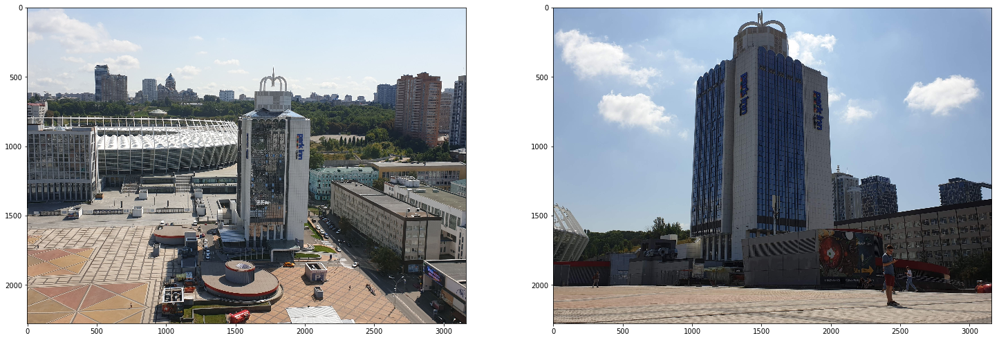

In [0]:
plot_images(img1, img2)

In [0]:
pts1 = np.array([
    [1775, 430,  1],
    [2035, 810,  1],
    [1773, 640,  1],
    [1670, 820,  1],
    [1985, 915,  1],
    [1820, 690,  1],
    [1815, 823,  1],
    [1955, 1095, 1]
], dtype=np.int32)

pts2 = np.array([
    [1500, 10,  1],
    [1975, 500, 1],
    [1590, 200, 1],
    [1540, 325, 1],
    [1920, 610, 1],
    [1650, 300, 1],
    [1735, 385, 1],
    [1895, 870, 1]
], dtype=np.int32)

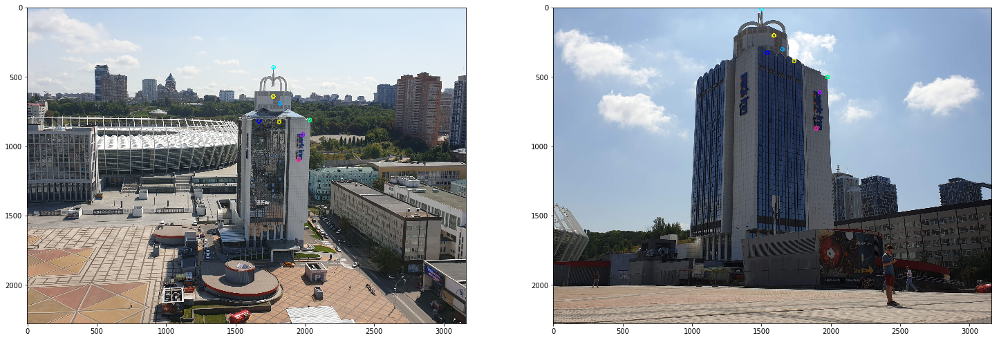

In [408]:
plot_points(img1, img2, pts1, pts2)

In [0]:
F = compute_fundamental(pts1, pts2)

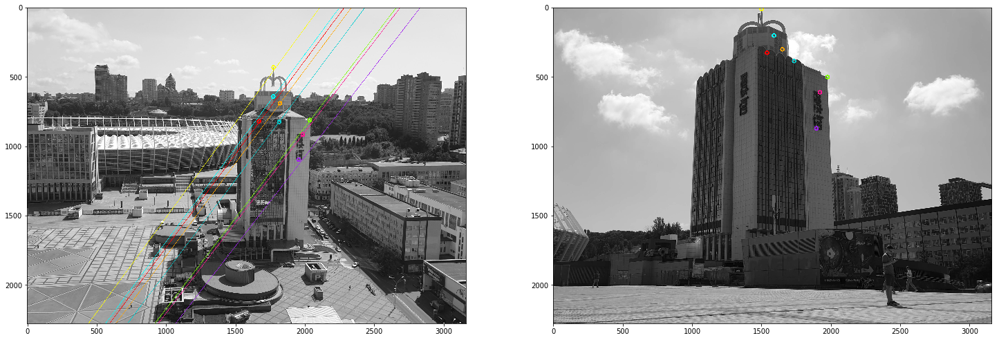

In [436]:
epipolar_lines = [np.dot(F.T, np.array([p[0], p[1], 1])) for p in pts2]
draw_lines(img1_gray, img2_gray, epipolar_lines, pts1, pts2)

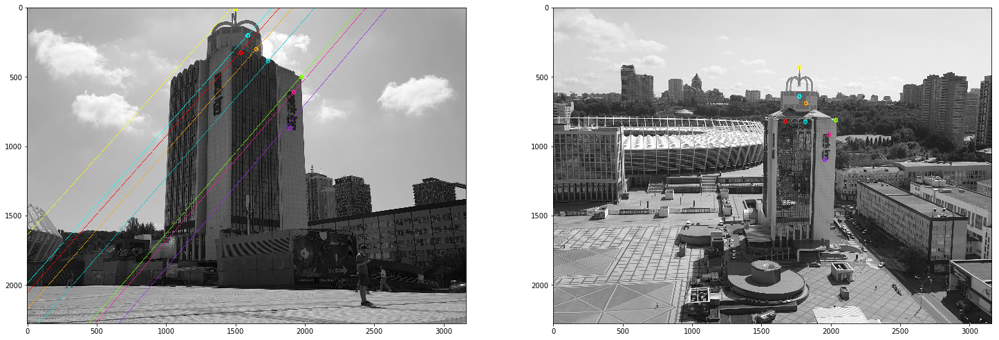

In [419]:
epipolar_lines = [np.dot(F, np.array([p[0], p[1], 1])) for p in pts1]
draw_lines(img2_gray, img1_gray, epipolar_lines, pts2, pts1)

### Image 2 - Image 3

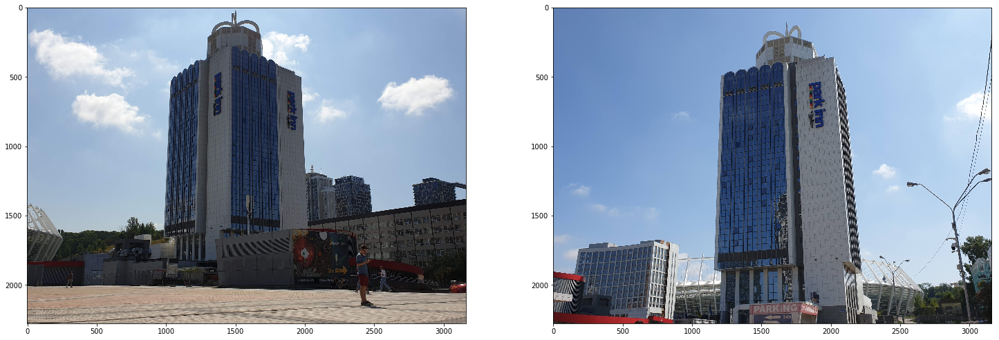

In [193]:
plot_images(img2, img3)

In [0]:
pts3 = np.array([
    [1675, 90,  1],
    [2015, 350, 1],
    [1580, 280, 1],
    [1310, 485, 1],
    [1925, 535, 1],
    [1665, 345, 1],
    [1565, 435, 1],
    [1895, 870, 1]
], dtype=np.int32)

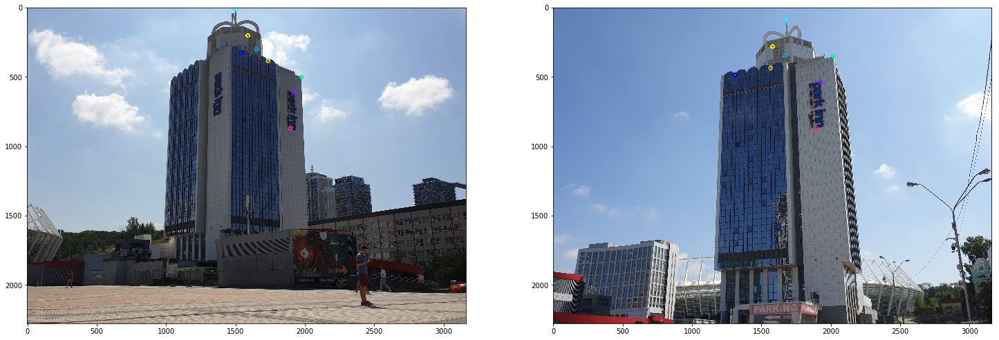

In [424]:
plot_points(img2, img3, pts2, pts3)

In [0]:
F = compute_fundamental(pts2, pts3)

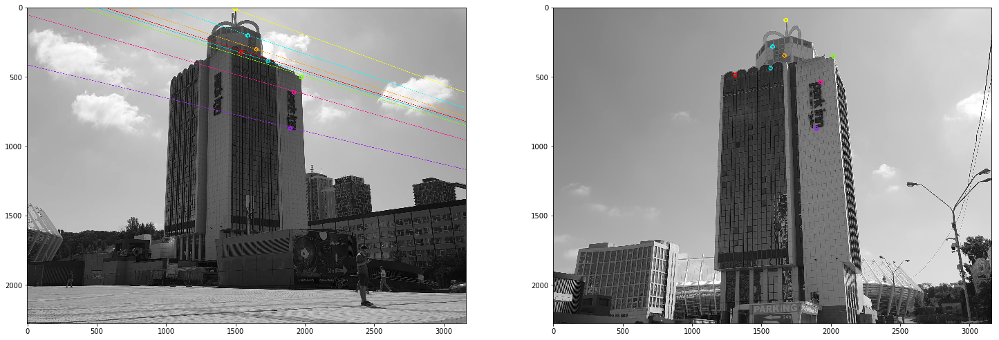

In [426]:
epipolar_lines = [np.dot(F.T, np.array([p[0], p[1], 1])) for p in pts3]
draw_lines(img2_gray, img3_gray, epipolar_lines, pts2, pts3)

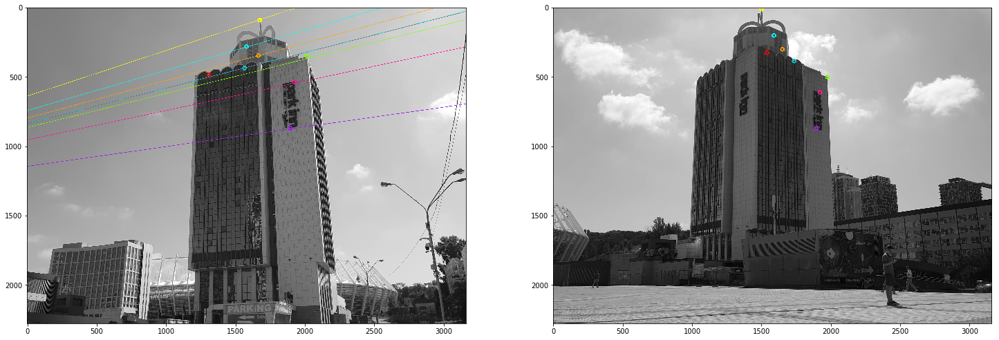

In [428]:
epipolar_lines = [np.dot(F, np.array([p[0], p[1], 1])) for p in pts2]
draw_lines(img3_gray, img2_gray, epipolar_lines, pts3, pts2)

### Image 1 - Image 3

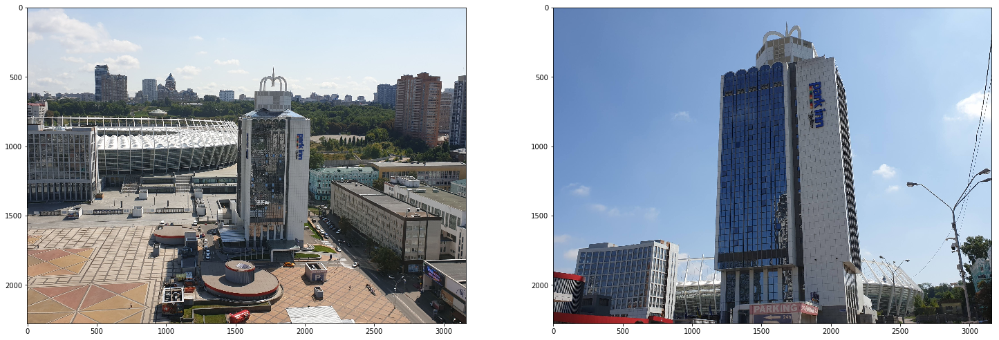

In [429]:
plot_images(img1, img3)

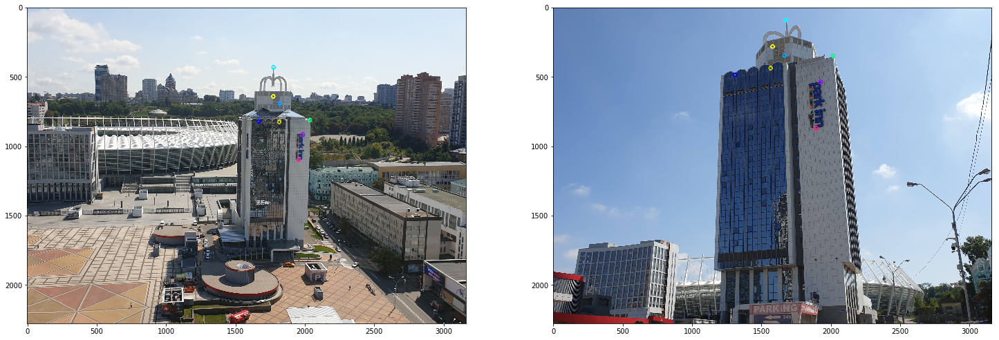

In [430]:
plot_points(img1, img3, pts1, pts3)

In [0]:
F = compute_fundamental(pts1, pts3)

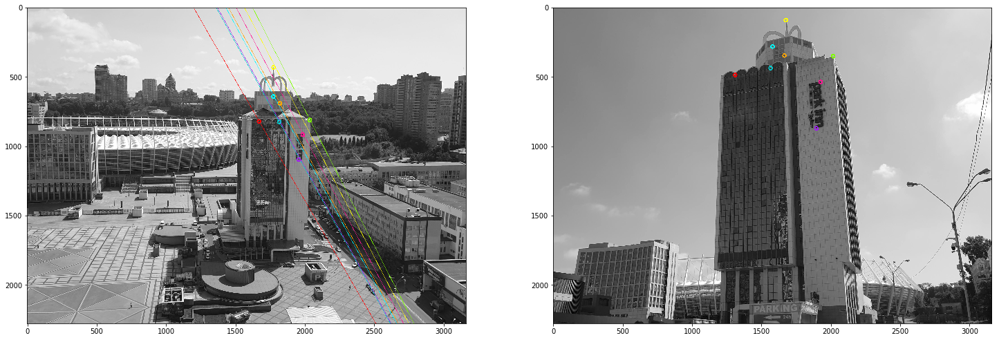

In [432]:
epipolar_lines = [np.dot(F.T, np.array([p[0], p[1], 1])) for p in pts3]
draw_lines(img1_gray, img3_gray, epipolar_lines, pts1, pts3)

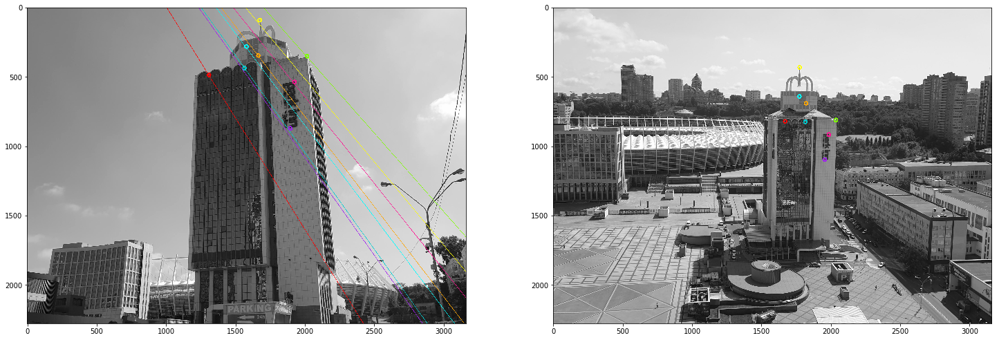

In [433]:
epipolar_lines = [np.dot(F, np.array([p[0], p[1], 1])) for p in pts1]
draw_lines(img3_gray, img1_gray, epipolar_lines, pts3, pts1)